In [4]:
import sys 
sys.path.append('/u/arego/project/Experimenting/')
from importlib import reload
import Trigger_Improve as ti
reload(ti)
import Trigger_Improve as ti
import matplotlib.pyplot as plt
import numpy as np

In [2]:
c_path='/viper/ptmp1/arego/CMerge/10.h5'
t_path='/viper/ptmp1/arego/RT6K/1010.h5'

In [5]:
CTrig=ti.main(c_path)

INFO:root:Running main
INFO:root:Initializing Collections
INFO:root:Loading Data
INFO:root:it took 14.166285037994385s to load data
INFO:root:Started Processing Hits
INFO:root:Histogram creation time: 17.55s
INFO:root:Finished Processing Hits
INFO:root:Creating Results df
INFO:root:Created Results df and took 10.575316905975342s
INFO:root:Generating plotable results
INFO:root:Generated plotable data and took 12.904318809509277 s
INFO:root:main ran in 71.48158502578735 s


In [3]:
TTrig=ti.main(t_path)

INFO:root:Running main
INFO:root:Initializing Collections
INFO:root:Loading Data
INFO:root:it took 0.6767618656158447s to load data
INFO:root:Started Processing Hits
INFO:root:Histogram creation time: 3.88s
INFO:root:Finished Processing Hits
INFO:root:Creating Results df
INFO:root:Created Results df and took 1.8041813373565674s
INFO:root:Generating plotable results
INFO:root:Generated plotable data and took 0.580822229385376 s
INFO:root:main ran in 10.747485637664795 s


In [3]:
hits_data, timer_bins, time_intervals=ti.initialize_and_load_data(t_path)

INFO:root:Initializing Collections and Loading Data
INFO:root:Initialization and data loading took 0.66s


In [6]:
record_data=pd.read_hdf(t_path,key='records',columns=['record_id','energy'])

In [ ]:
record_data

In [ ]:
plotable_data_dict[(2,)]

In [17]:
import pandas as pd
from itertools import combinations


hits_data, timer_bins, time_intervals=ti.initialize_and_load_data(t_path)
records=pd.read_hdf(t_path,key='records',columns=['record_id','energy'])

def filter_and_process(df, types):
    """Generates all subsets of the given types and filters the DataFrame accordingly."""
    # Generate all non-empty combinations of types
    plotable_data_dict={}
    for r in range(1, len(types) + 1):
        for subset in combinations(types, r):
            subset_df = df[df["type"].isin(subset)]
            aggregated_data = ti.process_hits(hits_data, timer_bins)
            trigger_data = ti.create_trigger_data(aggregated_data)
            plot_df = ti.aggregate_for_plotting(trigger_data)
            cols=[col for col in plot_df.columns if 'Mod' in col]
            plot_df=plot_df[['record_id']+cols].applymap(np.sum)
            plot_df=plot_df.merge(records,on='record_id')
            plotable_data_dict[subset]=plot_df
    return plotable_data_dict


types =hits_data['type'].unique()

plotable_data_dict=filter_and_process(hits_data, types)


INFO:root:Initialization and data loading took 6.36s


In [ ]:
from joblib import Parallel, delayed
from tqdm import tqdm
import pandas as pd
import numpy as np
from itertools import combinations
import os

def process_file(file_path):
    """Processes a single HDF5 file and returns the plotable data dictionary."""
    hits_data, timer_bins, time_intervals = ti.initialize_and_load_data(file_path)
    records = pd.read_hdf(file_path, key='records', columns=['record_id', 'energy'])

    types = hits_data['type'].unique()
    plotable_data_dict = {}

    for r in range(1, len(types) + 1):
        for subset in combinations(types, r):
            subset_df = hits_data[hits_data["type"].isin(subset)]
            aggregated_data = ti.process_hits(subset_df, timer_bins)
            trigger_data = ti.create_trigger_data(aggregated_data)
            plot_df = ti.aggregate_for_plotting(trigger_data)

            cols = [col for col in plot_df.columns if 'Mod' in col]
            plot_df = plot_df[['record_id'] + cols].applymap(np.sum)
            plot_df = plot_df.merge(records, on='record_id')

            plotable_data_dict[subset] = plot_df

    return file_path, plotable_data_dict


def process_files_in_parallel(file_paths, num_workers=8):
    """Processes multiple HDF5 files in parallel using Joblib and tqdm for progress tracking."""
    results = Parallel(n_jobs=num_workers)(
        delayed(process_file)(file) for file in tqdm(file_paths, desc="Processing Files", unit="file")
    )
    
    return {file: data_dict for file, data_dict in results}


# Example usage
path='/viper/ptmp1/arego/RT6K/'
file_list = [os.path.join(path,file) for file in os.listdir(path) if file.endswith('.h5')]
results = process_files_in_parallel(file_list[:100], num_workers=8)  # Adjust workers as needed


In [ ]:
results

In [10]:
cols=[col for col in plotable_data_dict[(2,)].columns if 'Mod' in col]
df=plotable_data_dict[(2,)][cols].applymap(np.sum)

In [ ]:
import pandas as pd
data_path='/ptmp/arego/RT6K_1file/2.h5'
trigger_interval=10
if os.path.basename(data_path).endswith('.h5'):
    hits_data=pd.read_hdf(data_path,key='hits')
    timer_bins = np.arange(hits_data['time'].min(),hits_data['time'].max()  + 10, 10)
    aggregated_data = ti.process_hits(hits_data, timer_bins)
    trigger_data = ti.create_trigger_data(aggregated_data)
    plotable_trigger_data = ti.aggregate_for_plotting(trigger_data)

INFO:root:Plotting results for record: 0


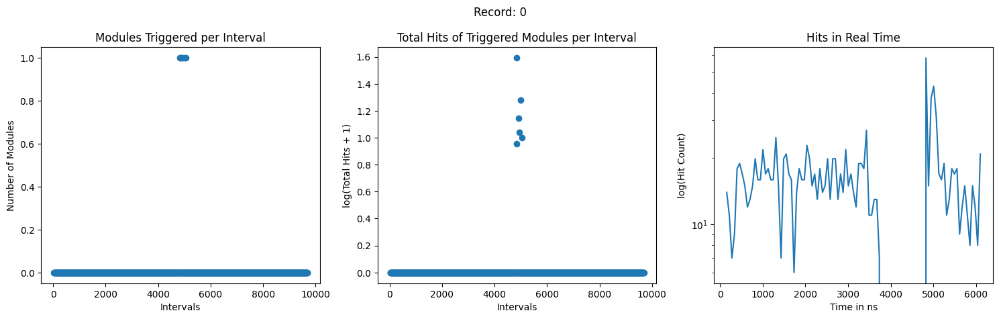

INFO:root:Plotting results for record: 1


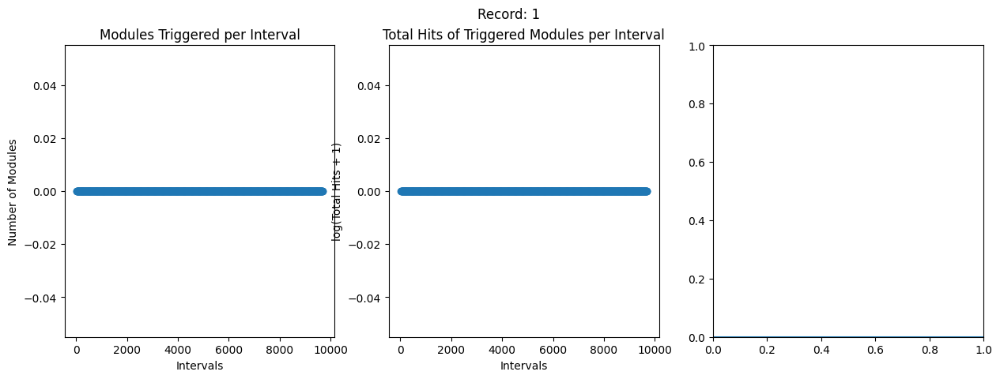

INFO:root:Plotting results for record: 4


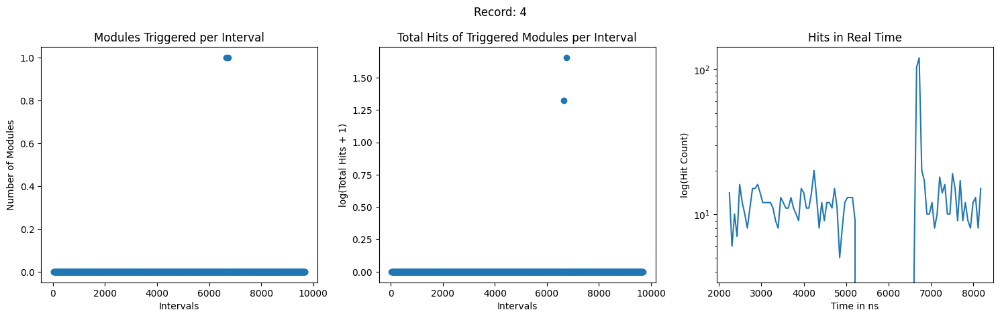

INFO:root:Plotting results for record: 9


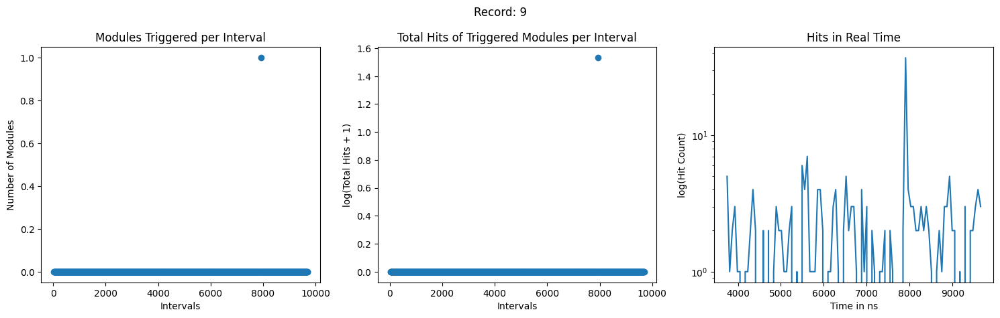

INFO:root:Plotting results for record: 10


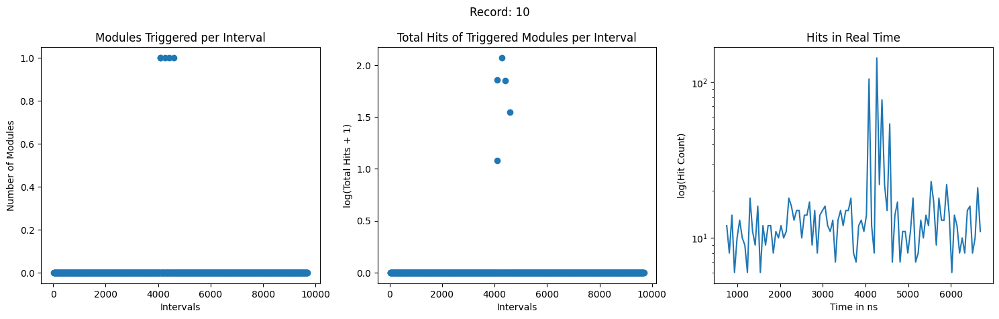

INFO:root:Plotting results for record: 15


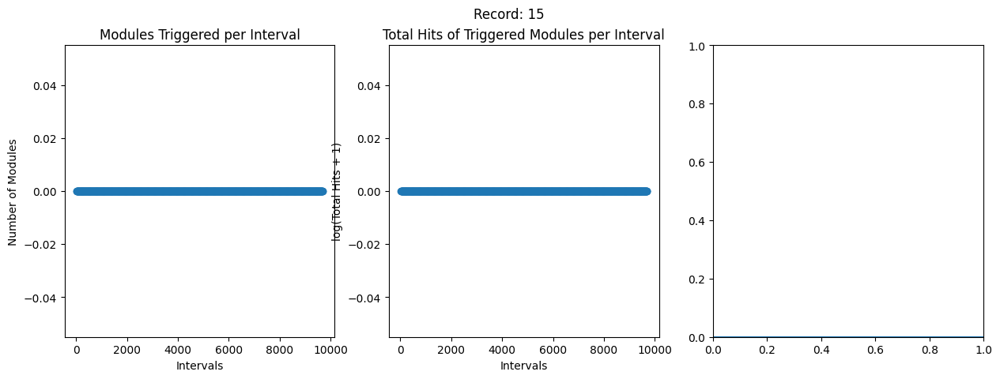

INFO:root:Plotting results for record: 16


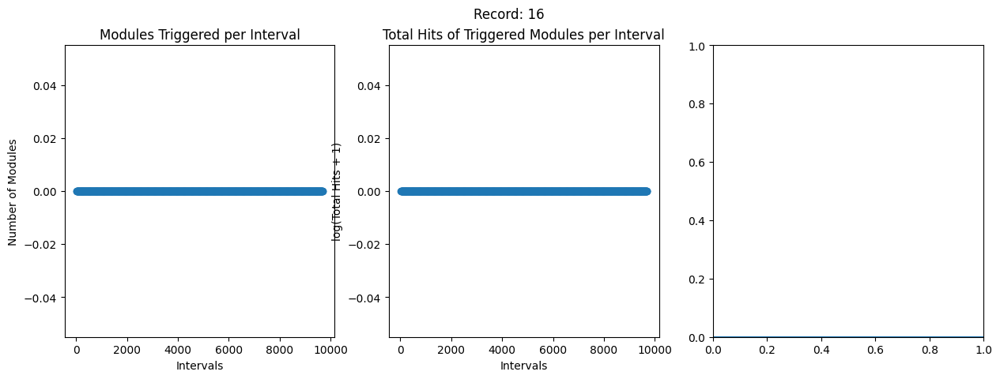

INFO:root:Plotting results for record: 17


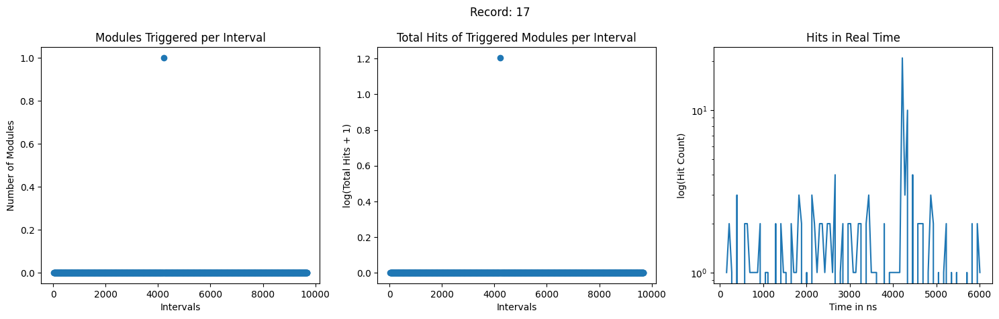

INFO:root:Plotting results for record: 25


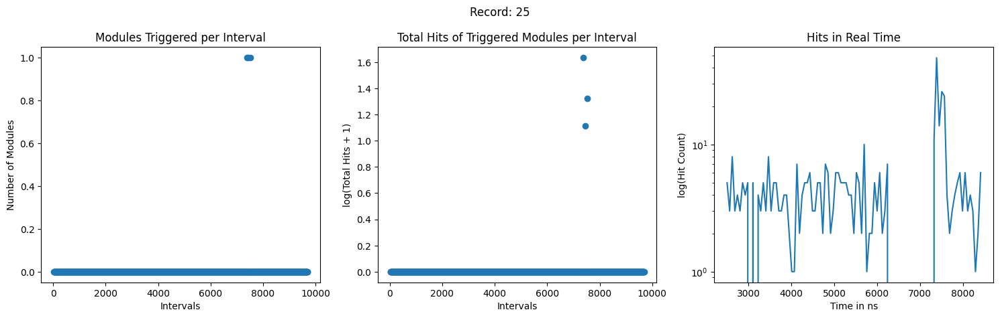

INFO:root:Plotting results for record: 27


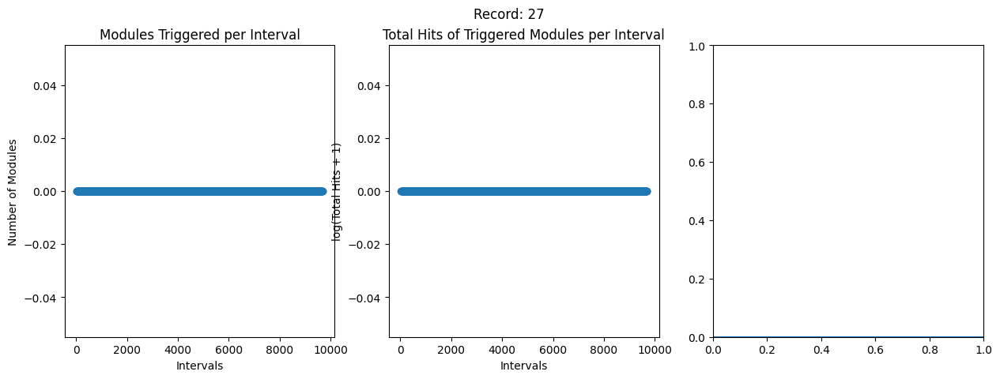

INFO:root:Plotting results for record: 28


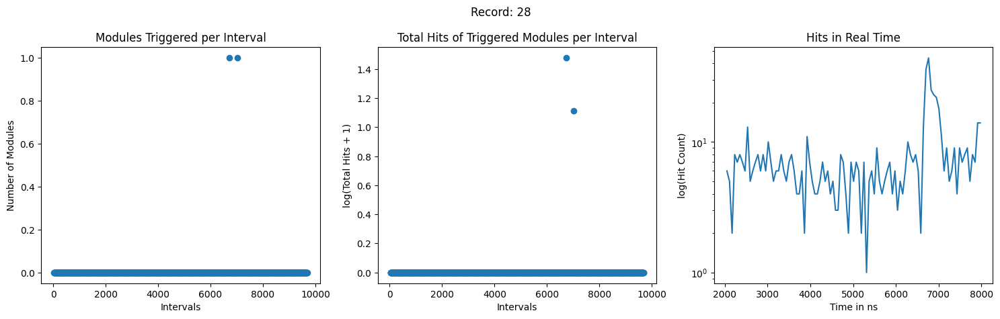

INFO:root:Plotting results for record: 29


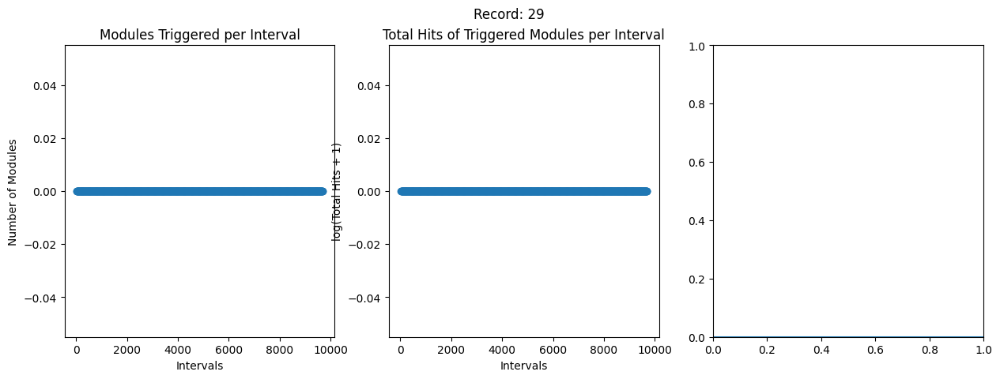

INFO:root:Plotting results for record: 30


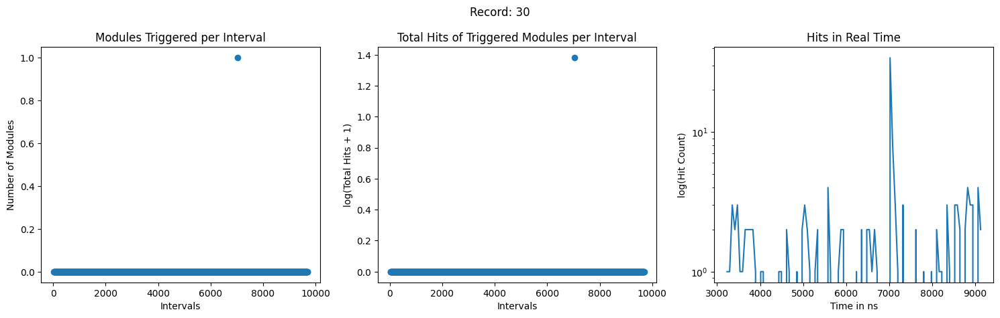

INFO:root:Plotting results for record: 34


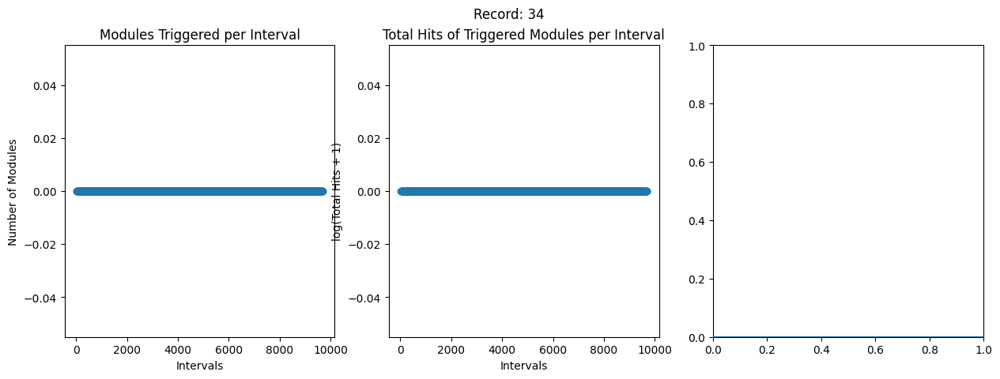

INFO:root:Plotting results for record: 35


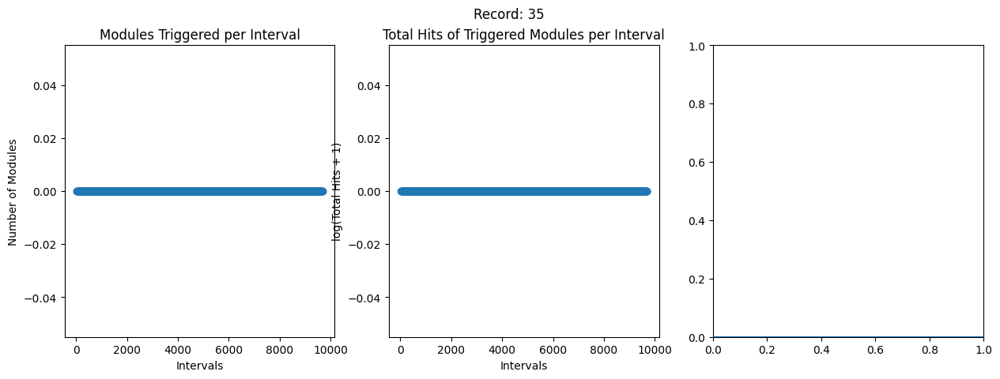

INFO:root:Plotting results for record: 36


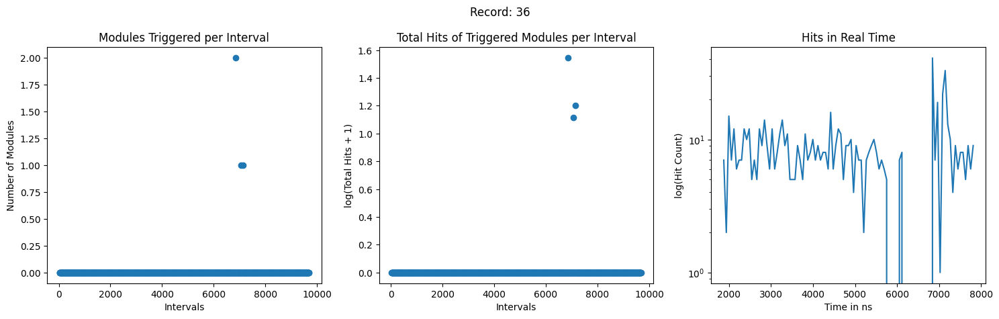

INFO:root:Plotting results for record: 37


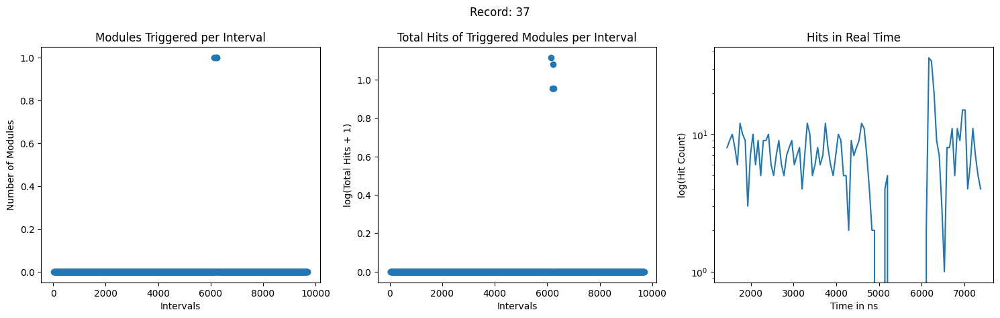

INFO:root:Plotting results for record: 38


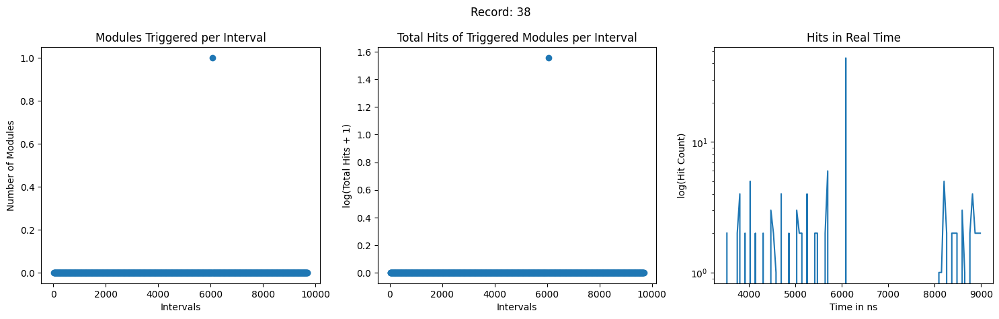

INFO:root:Plotting results for record: 39


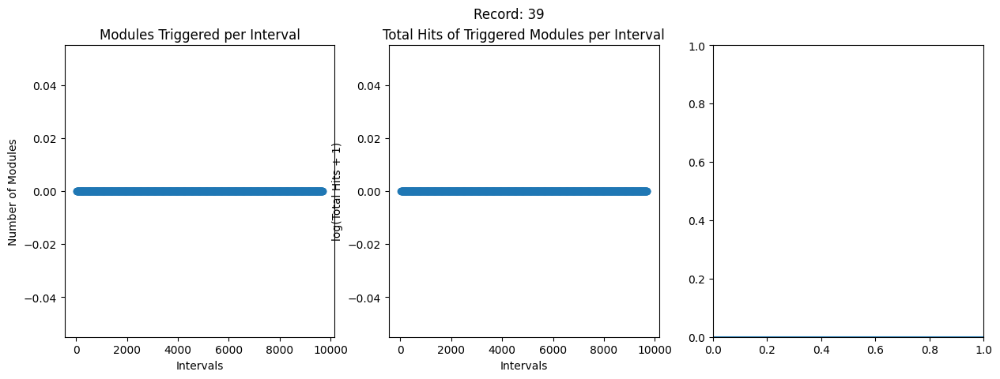

INFO:root:Plotting results for record: 40


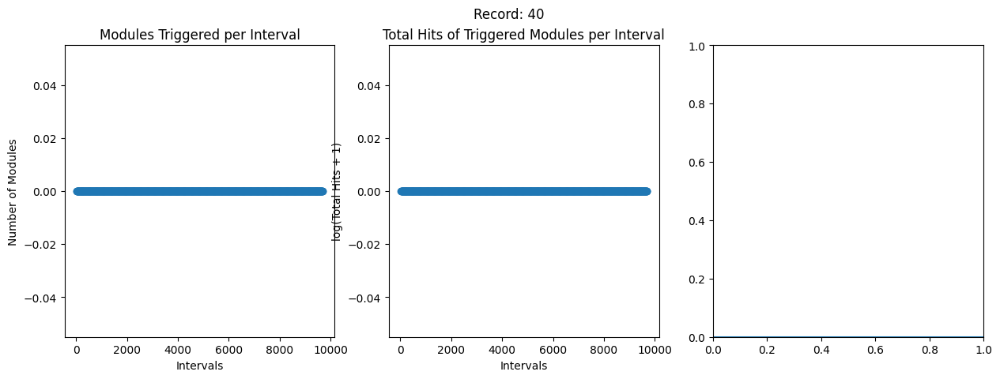

In [12]:
ti.plot_results(plotable_trigger_data, intervals, 7, num_plots=None)

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import mpl_scatter_density  # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap

# Define a new color map (for example, `inferno` or `plasma`)
cmap = plt.cm.inferno  # Feel free to change to `inferno`, `cividis`, etc.

def plot_energy_hits(hit, energy,col):
    """
    Generates a scatter density plot of energy versus hits.

    Parameters:
        hit (dask.array): Dask array containing hit data.
        energy (dask.array): Dask array containing energy data.

    Returns:
        None (displays the plot).
    """

    # Filter out invalid energy values
    valid_indices = (energy > 0) & (hit > 0)  # Ensure both hit and energy are positive

    hit = hit[valid_indices]
    energy = energy[valid_indices]

    x = np.log10(hit)  # Avoid log(0) issues
    y = np.log10(energy)

    if x.shape[0]==0 or y.shape[0]==0:
        return None

    # Create and show plot
    fig = plt.figure(figsize=(10, 6))  # Aspect ratio of 16:9
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, cmap=cmap)
    fig.colorbar(density, label='Event Density')

    # Plot aesthetics
    ax.set_xlabel("Log10(Hits)", fontsize=12)
    ax.set_ylabel("Log10(Energy)", fontsize=12)
    ax.set_title(f"Scatter Density Plot of Energy vs Hits {col}", fontsize=14)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.tight_layout()
    plt.show()

# Example usage:
# plot_energy_hits(hit, energy)  # Ensure hit and energy are Dask arrays

In [40]:
import os
import dask.dataframe as dd

base_directory = "/viper/u1/arego/Project/Thesis/plot/TD/"

# List all subdirectories inside base_directory
for folder in os.listdir(base_directory):
    folder_path = os.path.join(base_directory, folder)
    
    # Check if it's a directory (not a file)
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")

        # Read all Parquet files inside the folder
        ddf = dd.read_parquet(os.path.join(folder_path, "*.parquet"))

        # Define output file name (one per folder)
        output_path = os.path.join(base_directory, f"Merged_{folder}.parquet")

        # Save merged file
        ddf.repartition(npartitions=1).to_parquet(output_path, write_index=False)
        print(f"Saved: {output_path}")


Processing folder: 21
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_21.parquet
Processing folder: 2
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2.parquet
Processing folder: 2_20
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20.parquet
Processing folder: 2_21
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_21.parquet
Processing folder: 20_21
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_20_21.parquet
Processing folder: 20
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_20.parquet
Processing folder: 2_20_21
Saved: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20_21.parquet


In [17]:
cols=[col for col in df.columns if "Hit" in col]

In [42]:
cols[::3]

['Mod Hit Count CL: 0',
 'Mod Hit Count CL: 3',
 'Mod Hit Count CL: 6',
 'Mod Hit Count CL: 9',
 'Mod Hit Count CL: 12',
 'Mod Hit Count CL: 15']

In [45]:
path='/viper/u1/arego/Project/Thesis/plot/TD/'
files=[os.path.join(path,f) for f in os.listdir(path) if 'parquet' in f]

/viper/u1/arego/Project/Thesis/plot/TD/Merged_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


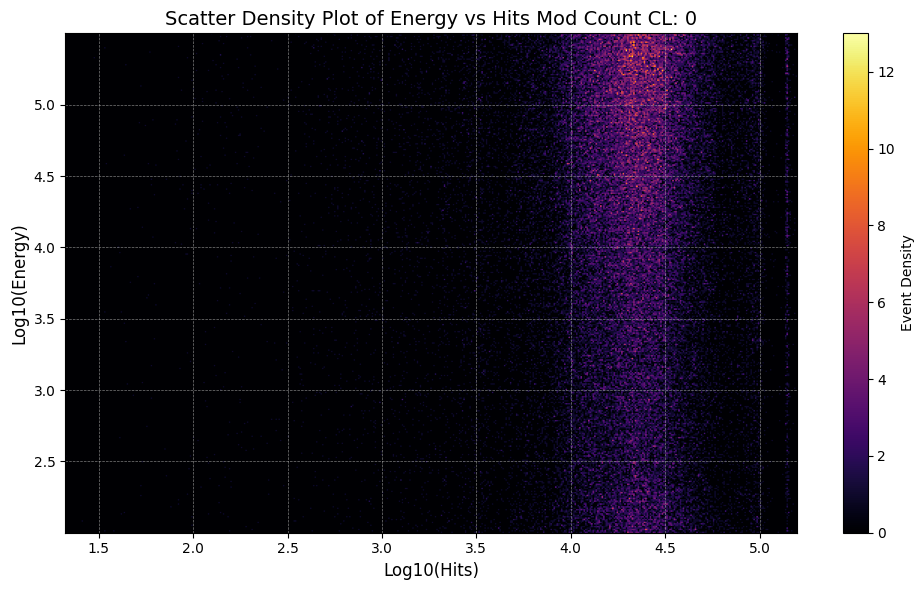

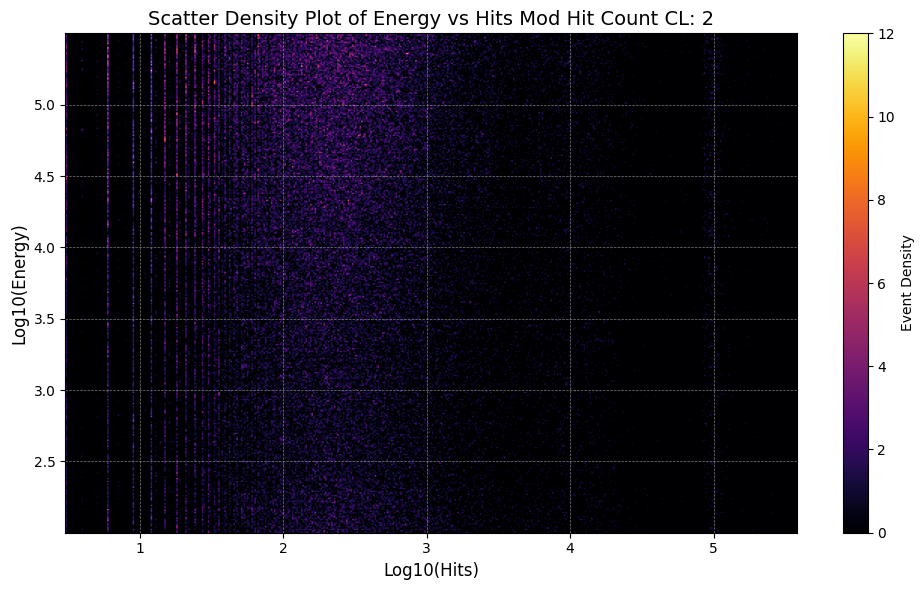

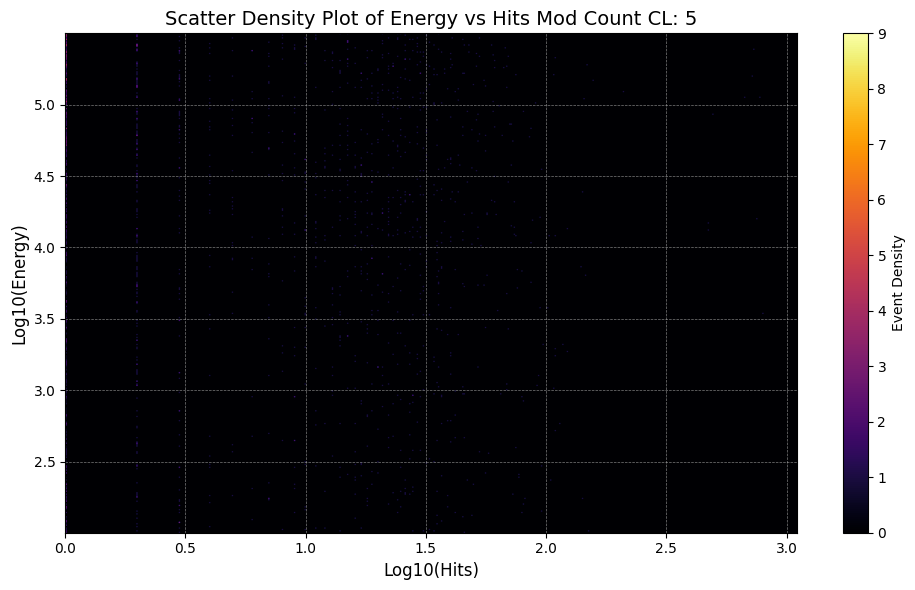

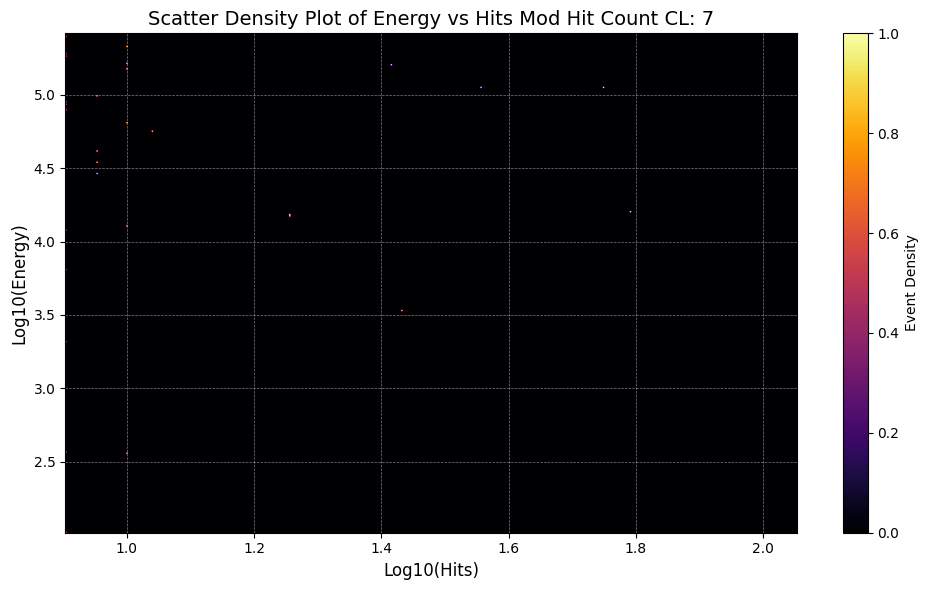

/viper/u1/arego/Project/Thesis/plot/TD/Merged_2.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


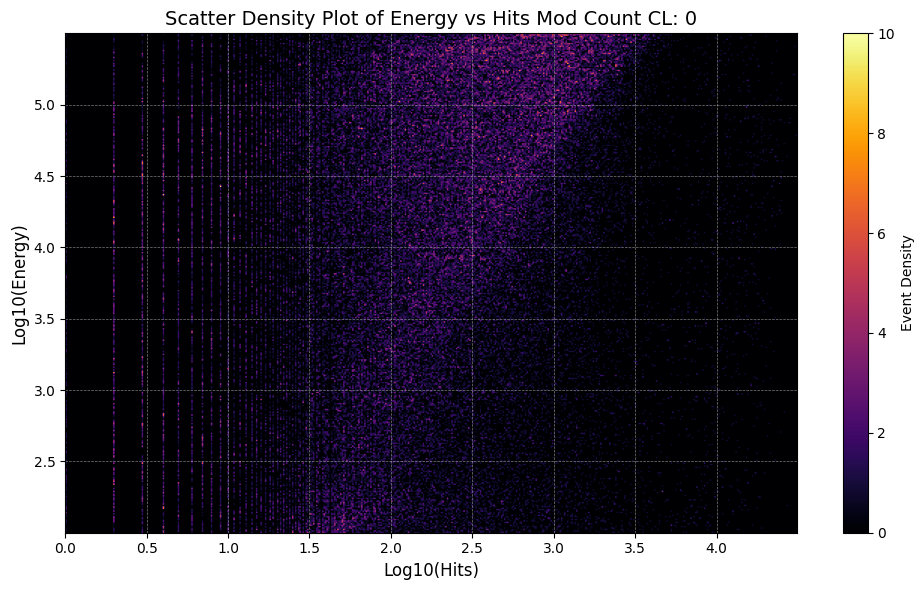

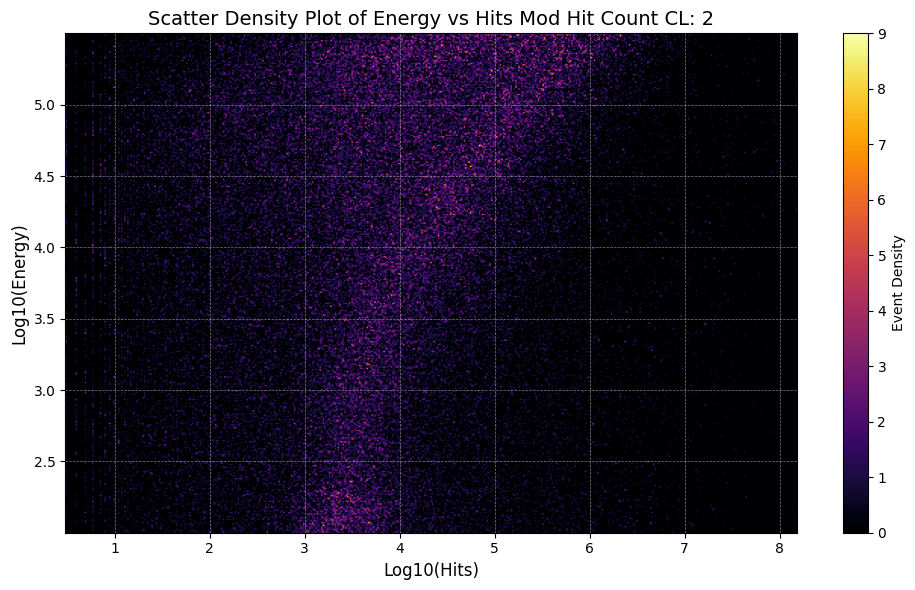

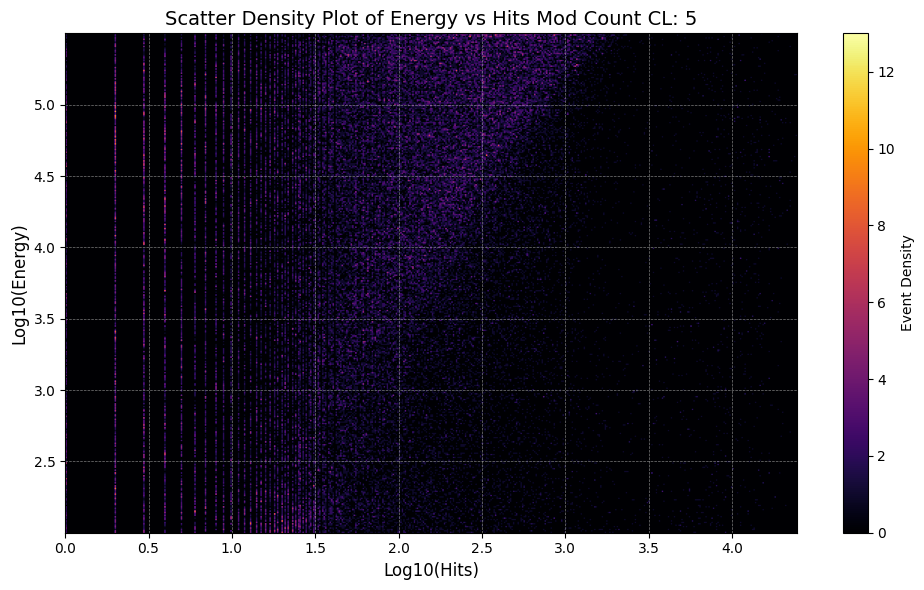

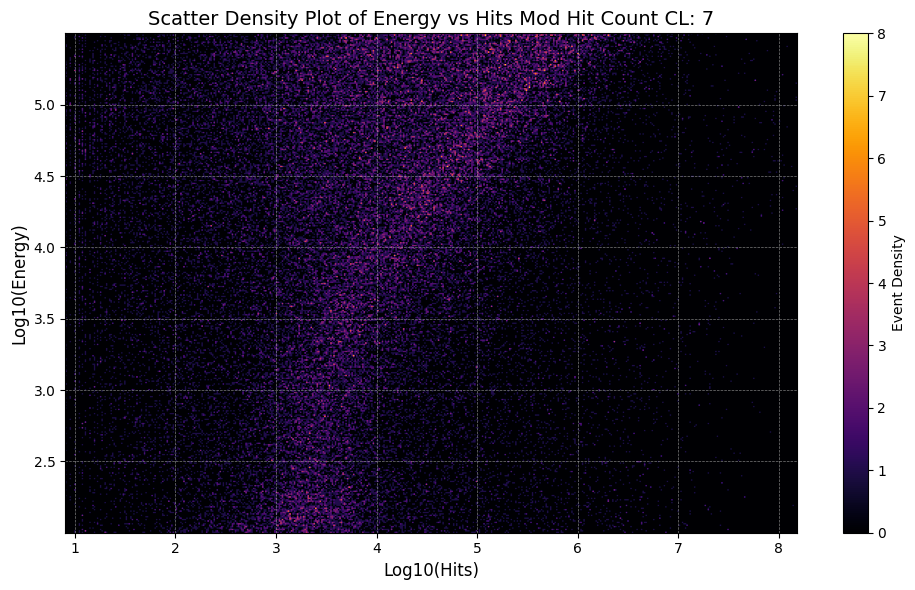

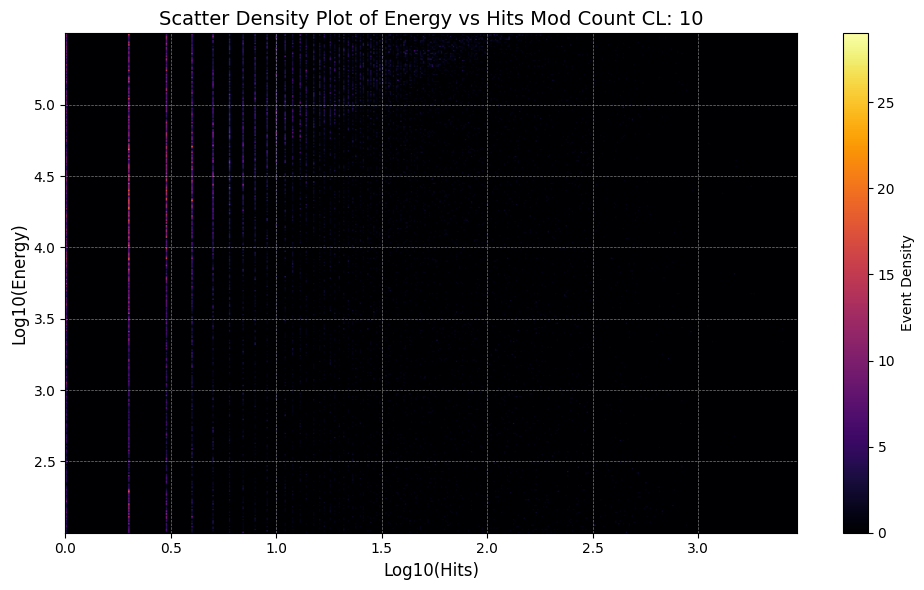

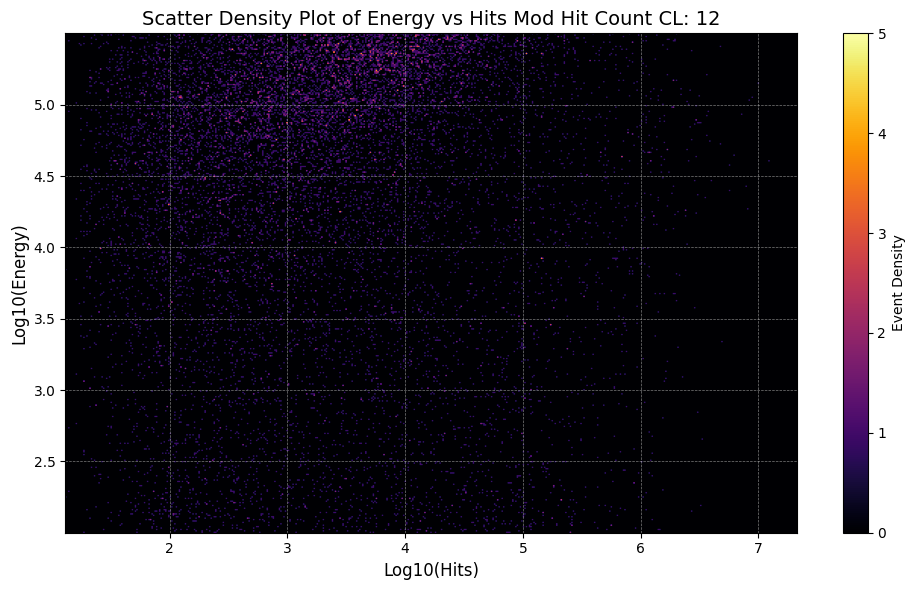

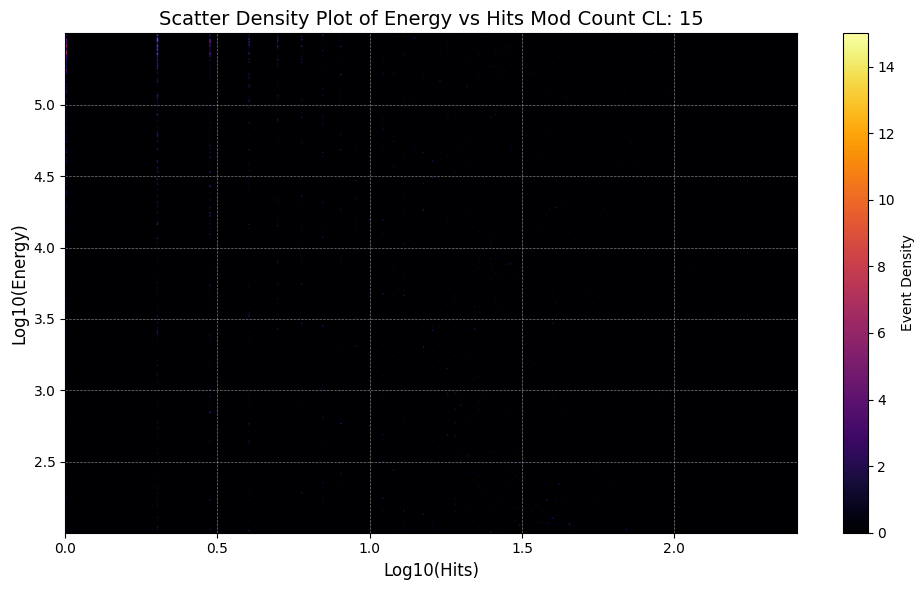

/viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


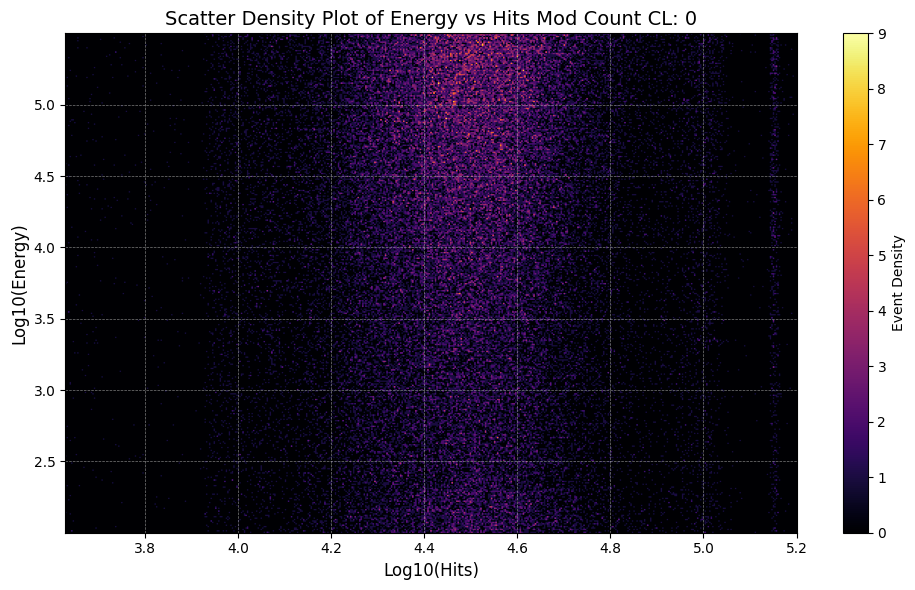

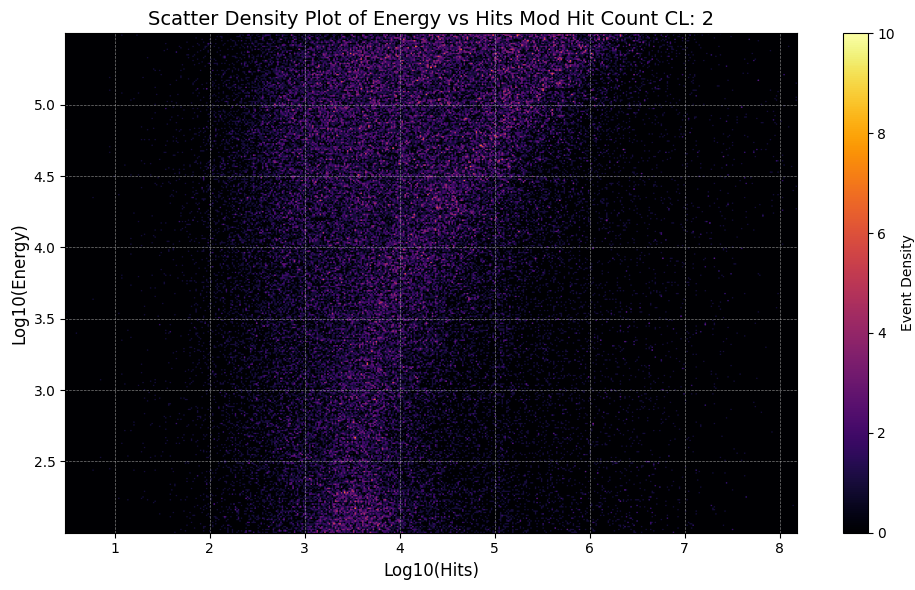

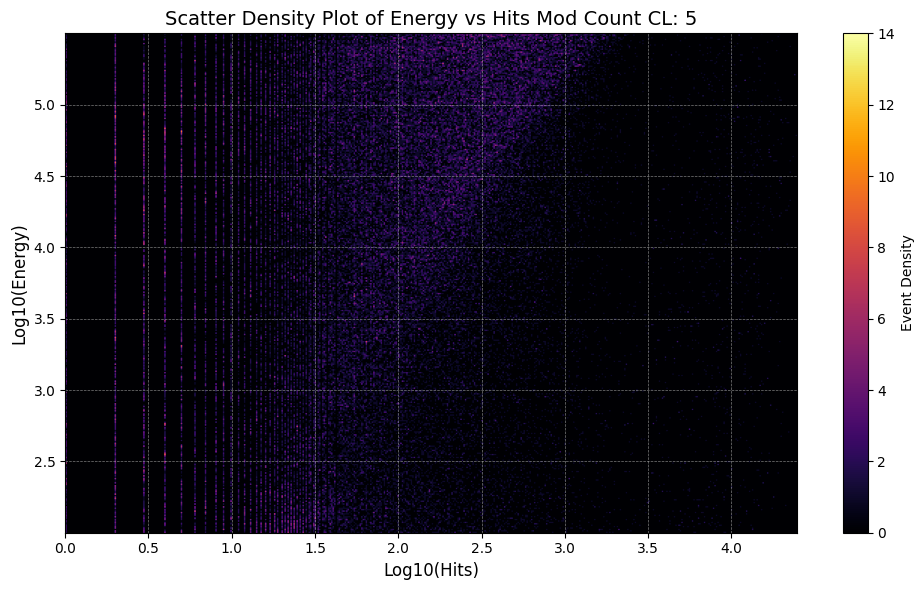

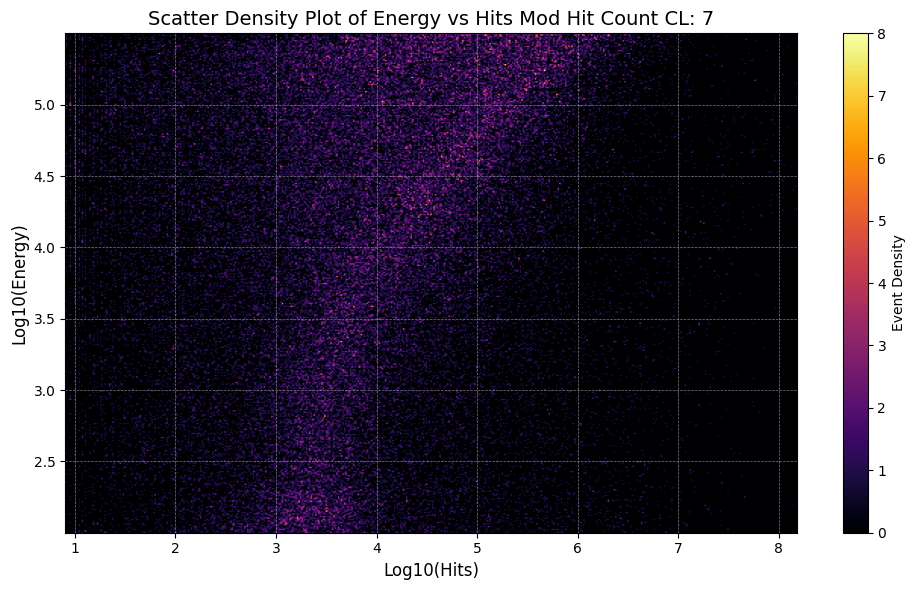

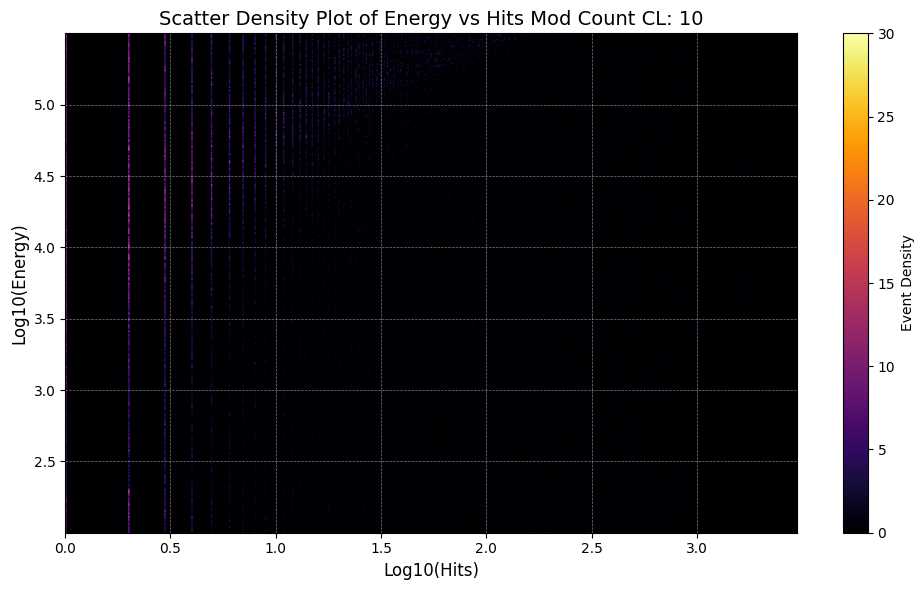

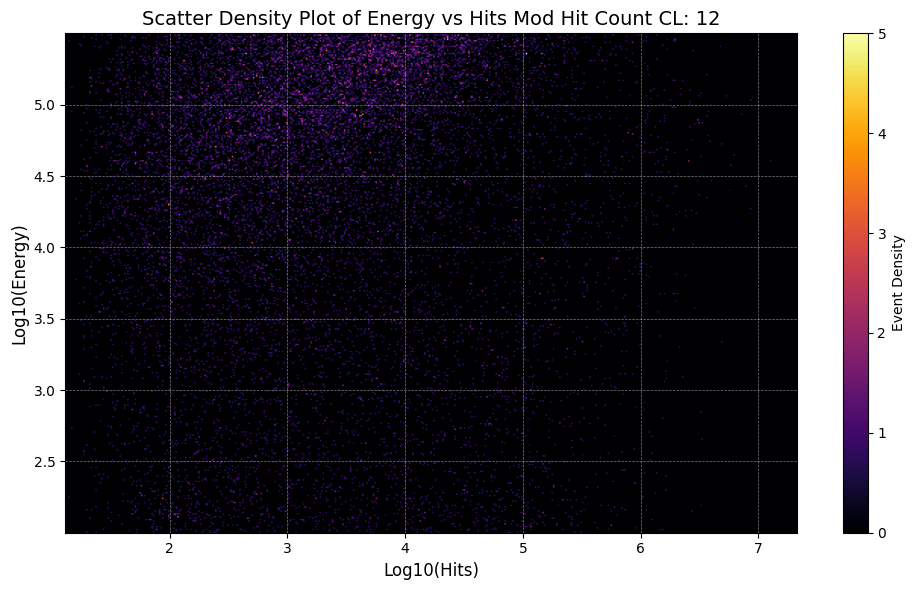

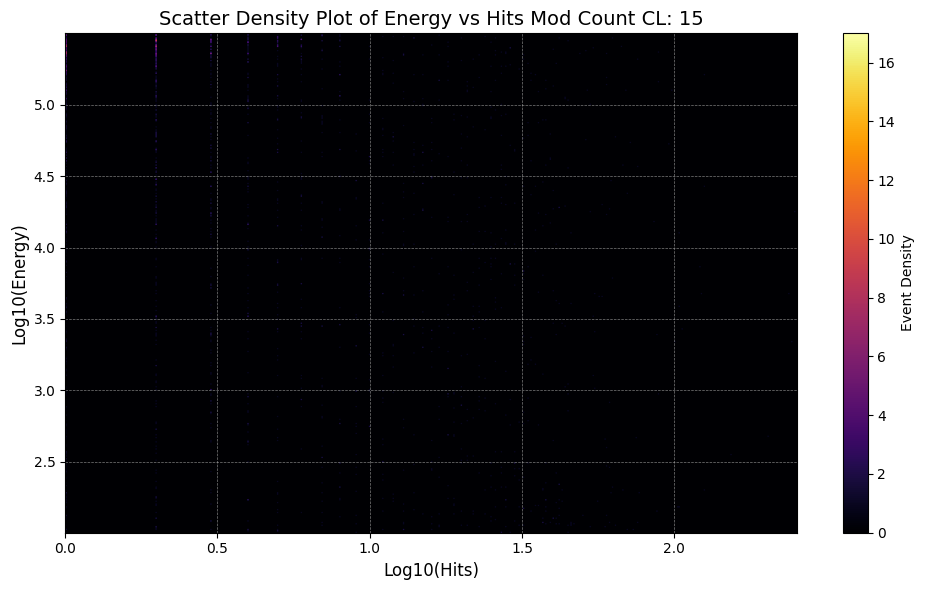

/viper/u1/arego/Project/Thesis/plot/TD/Merged_2_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


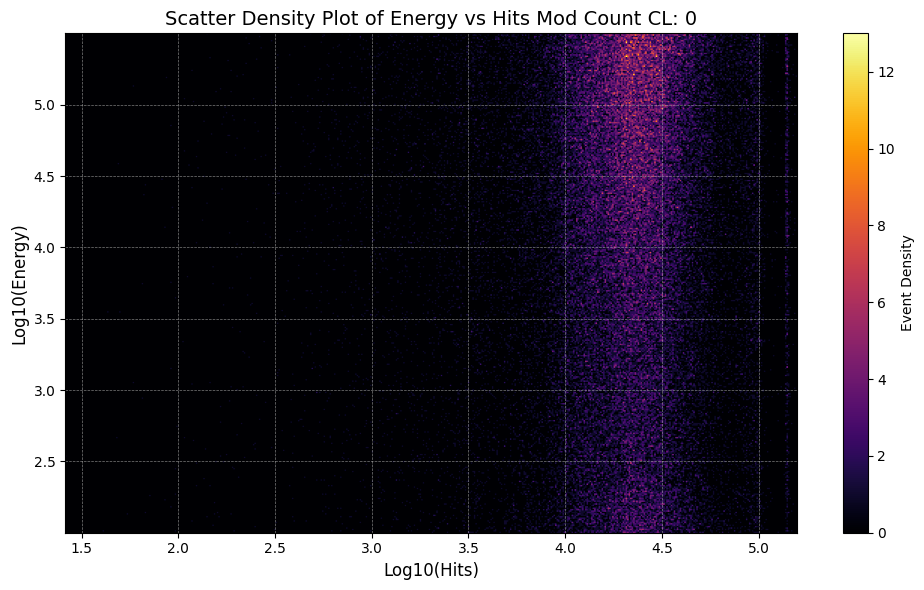

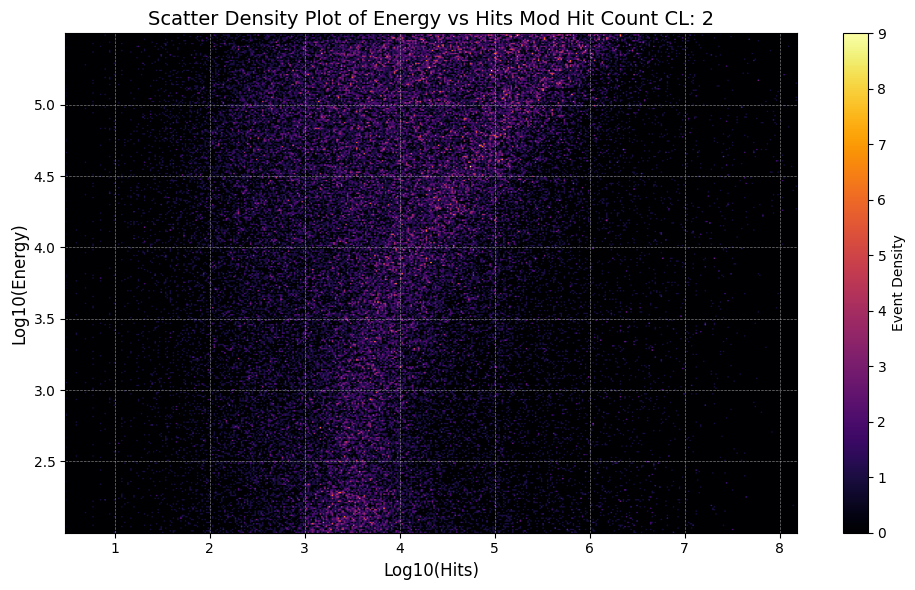

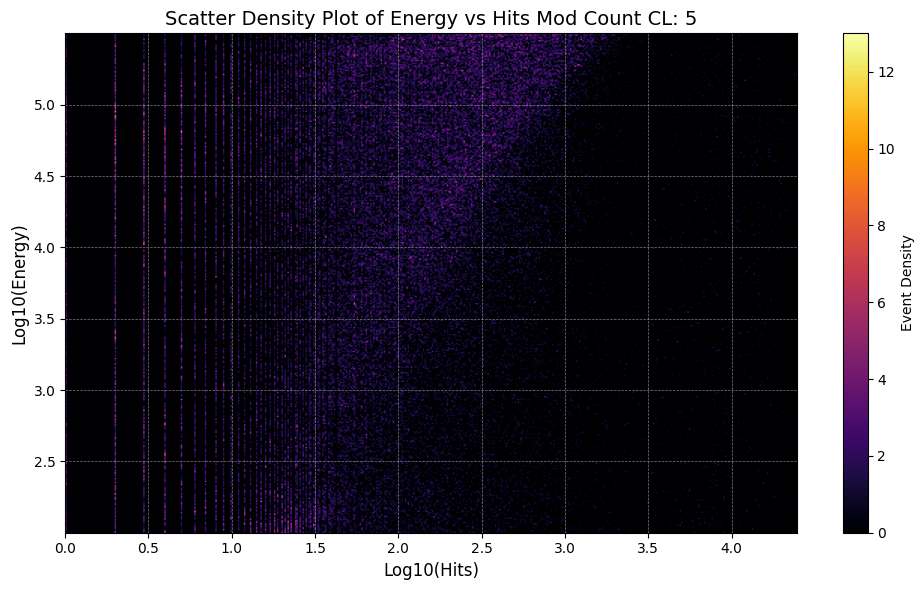

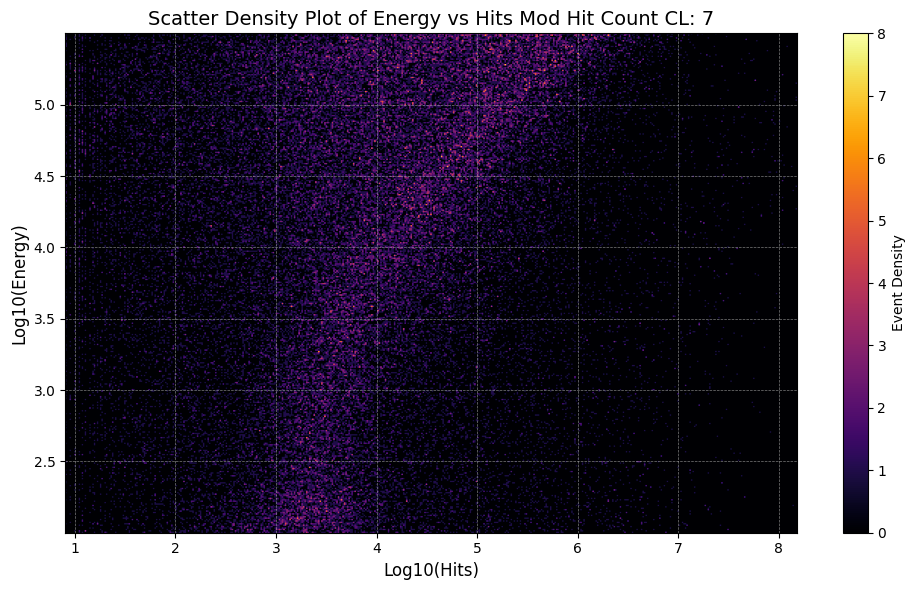

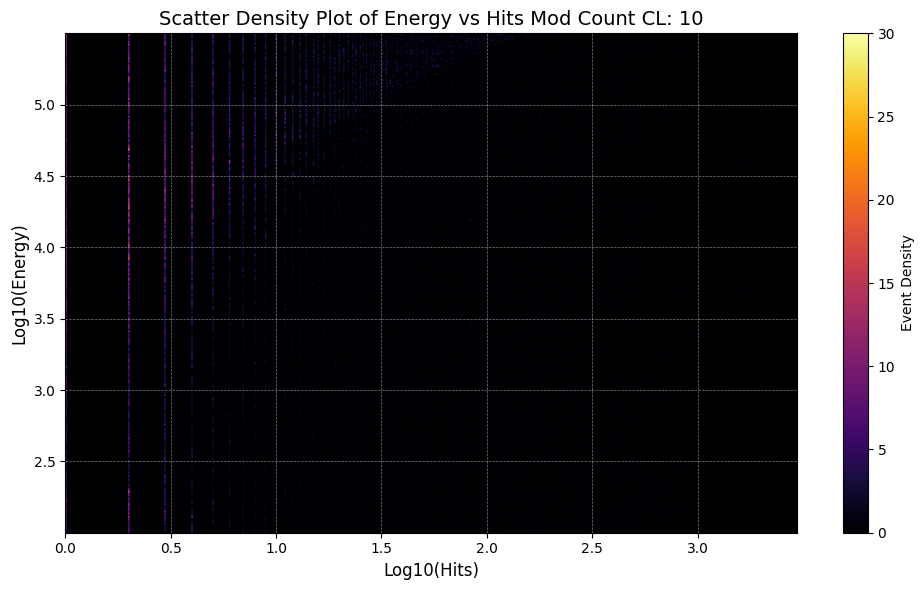

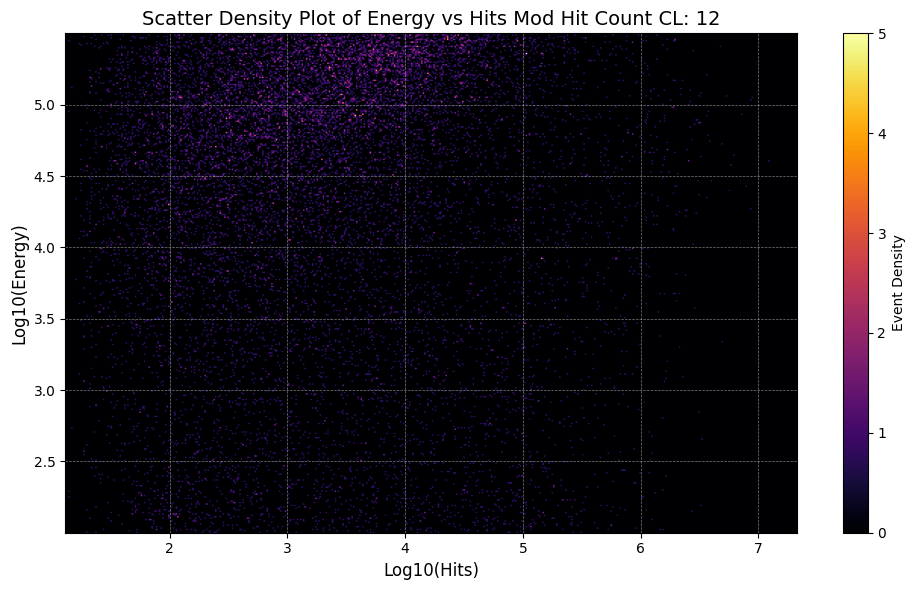

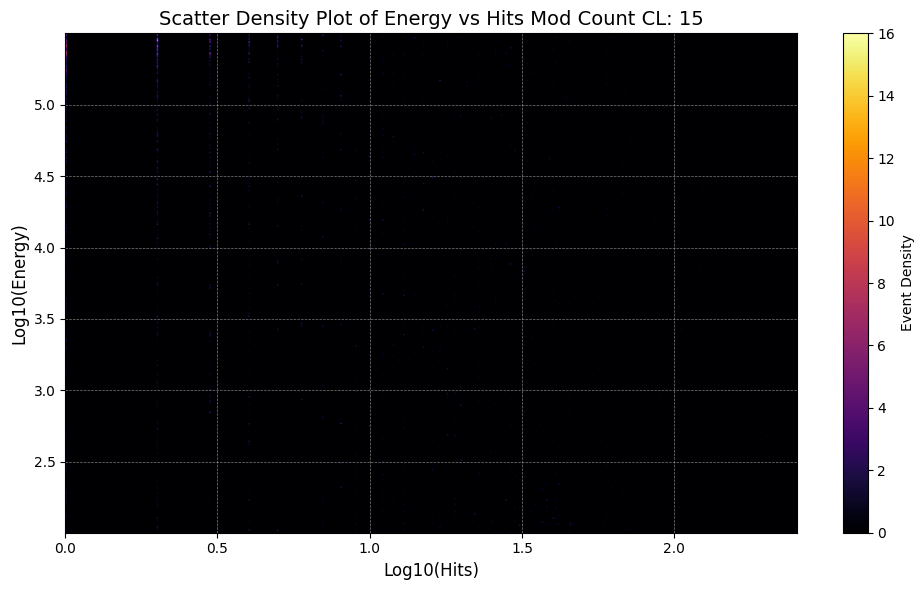

/viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


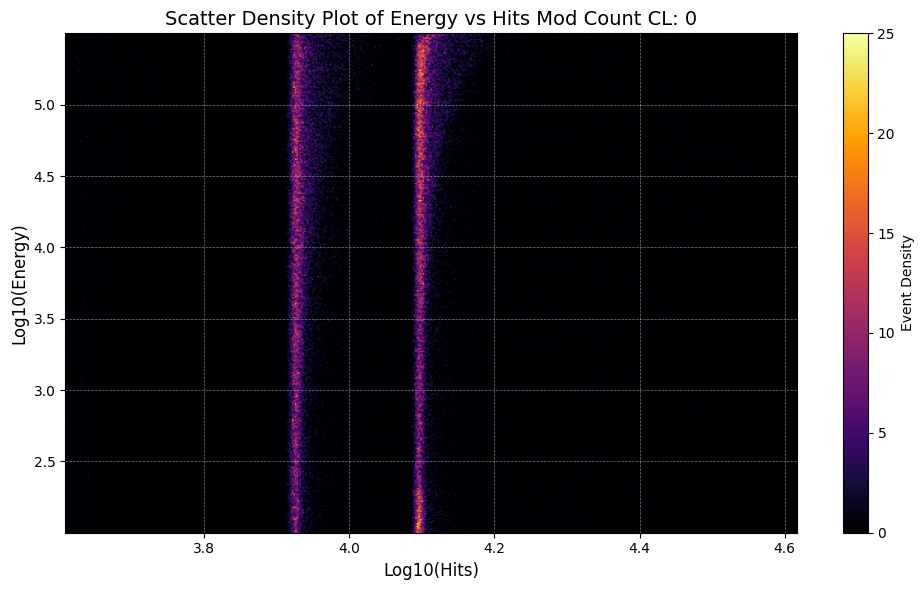

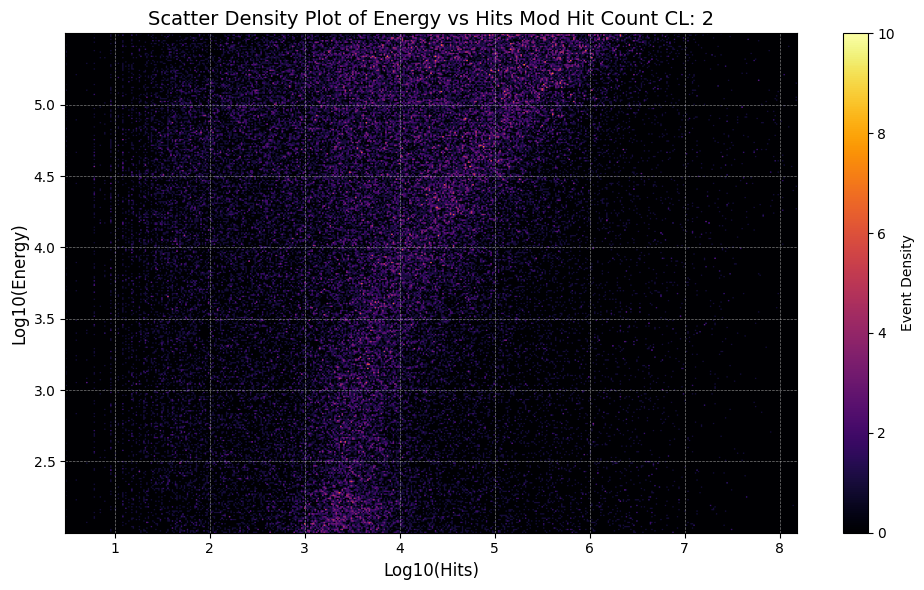

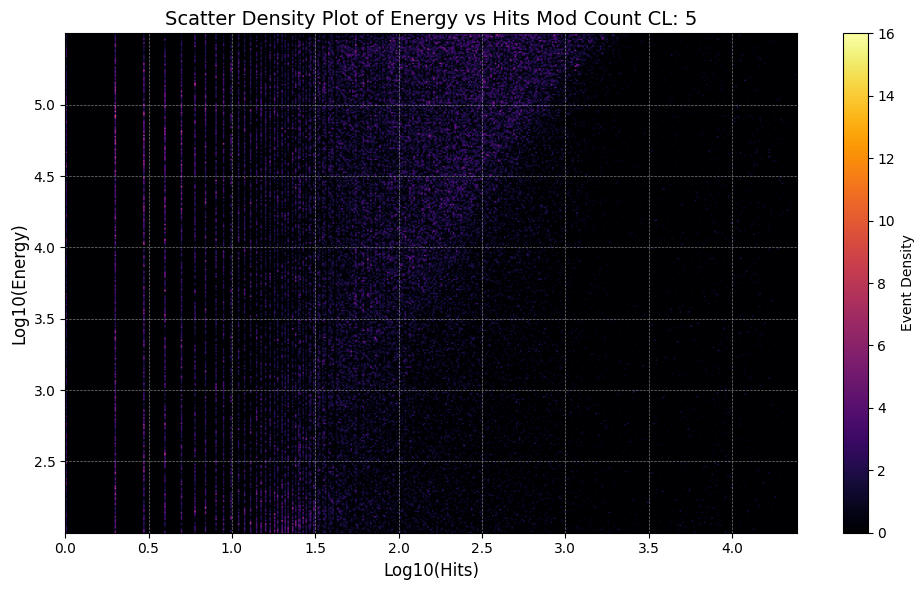

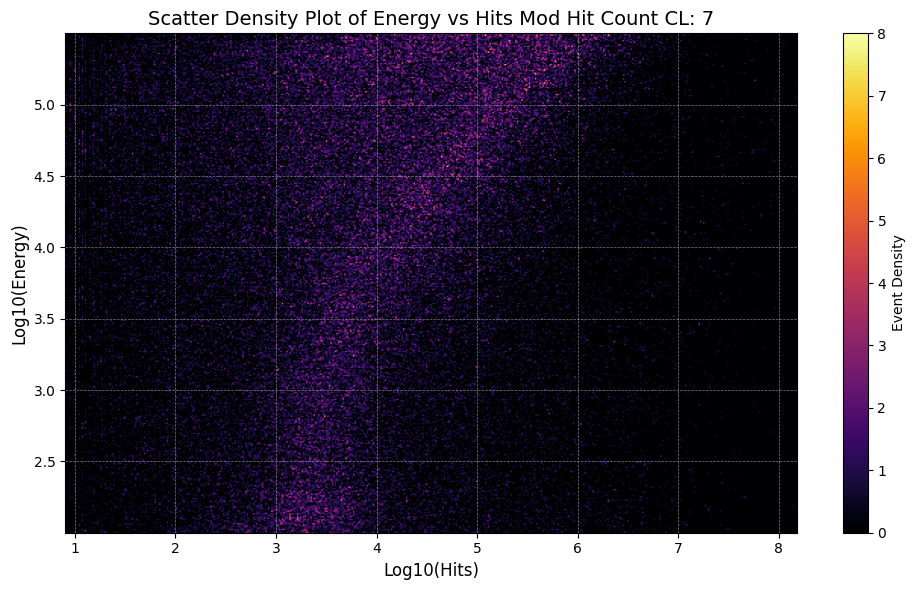

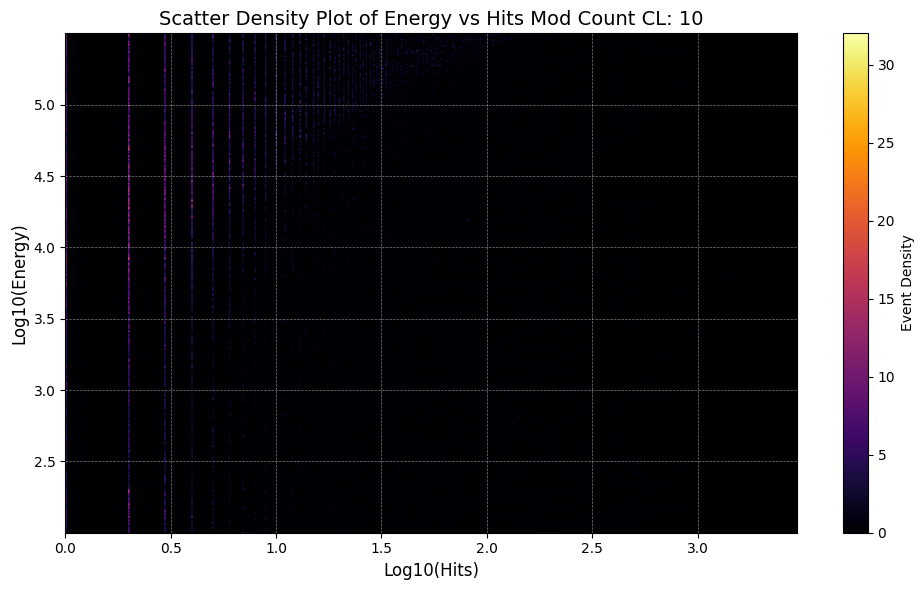

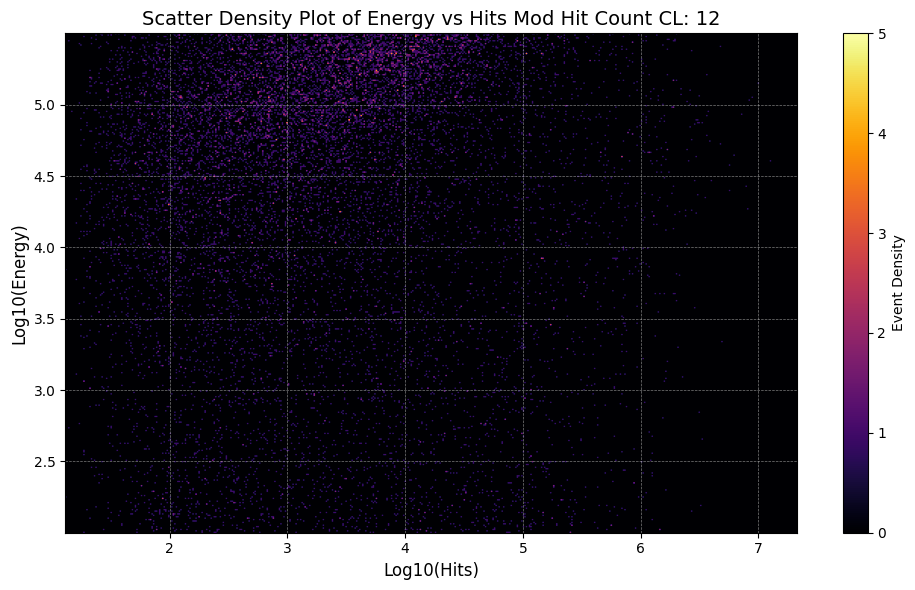

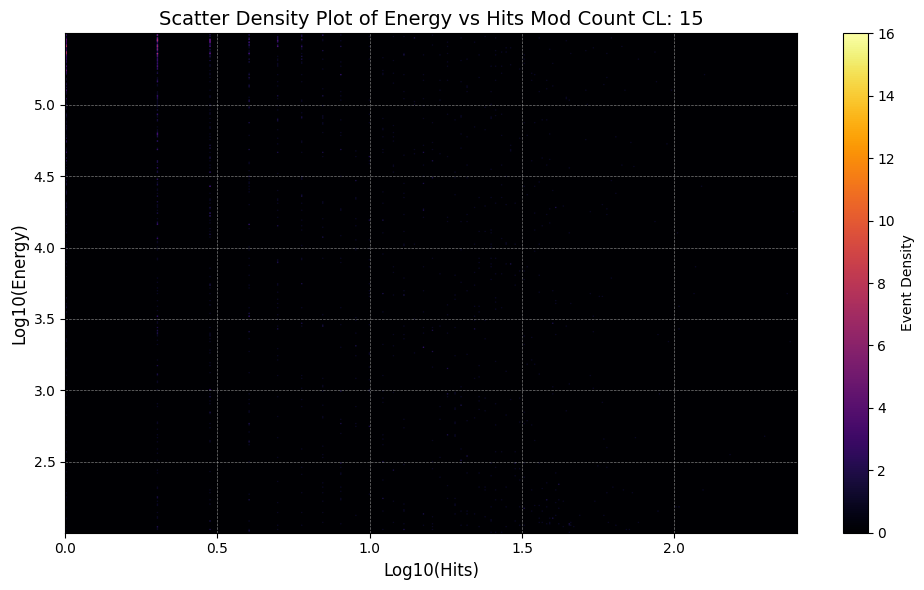

/viper/u1/arego/Project/Thesis/plot/TD/Merged_20_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


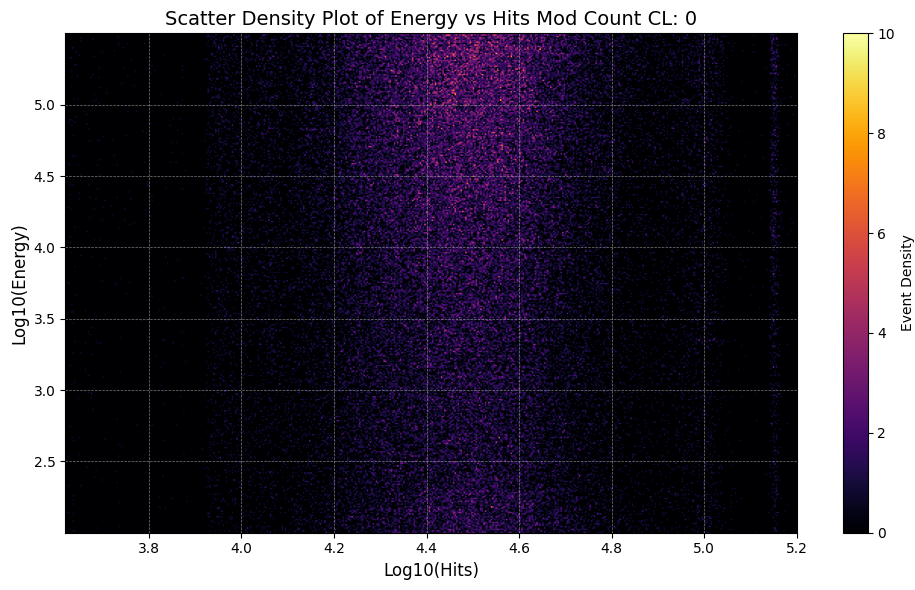

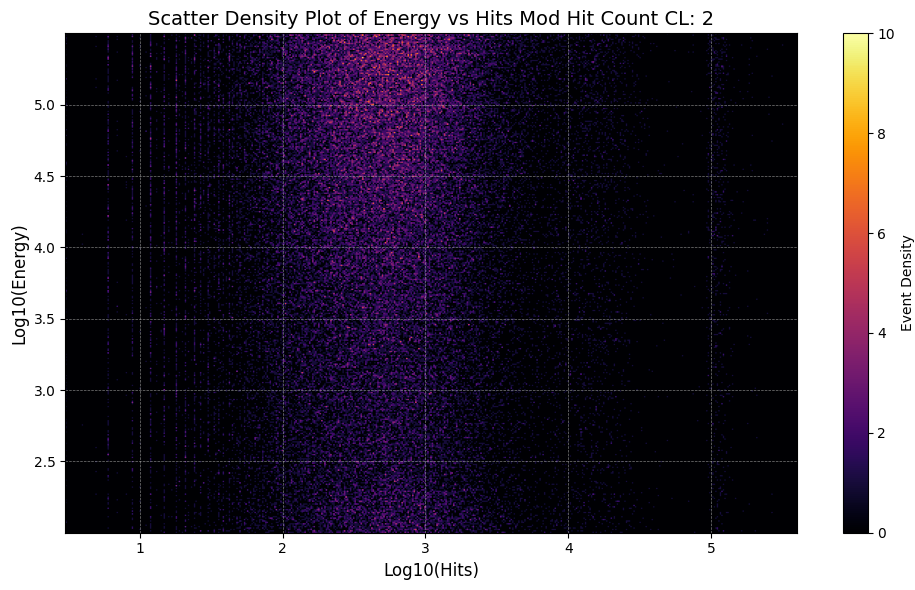

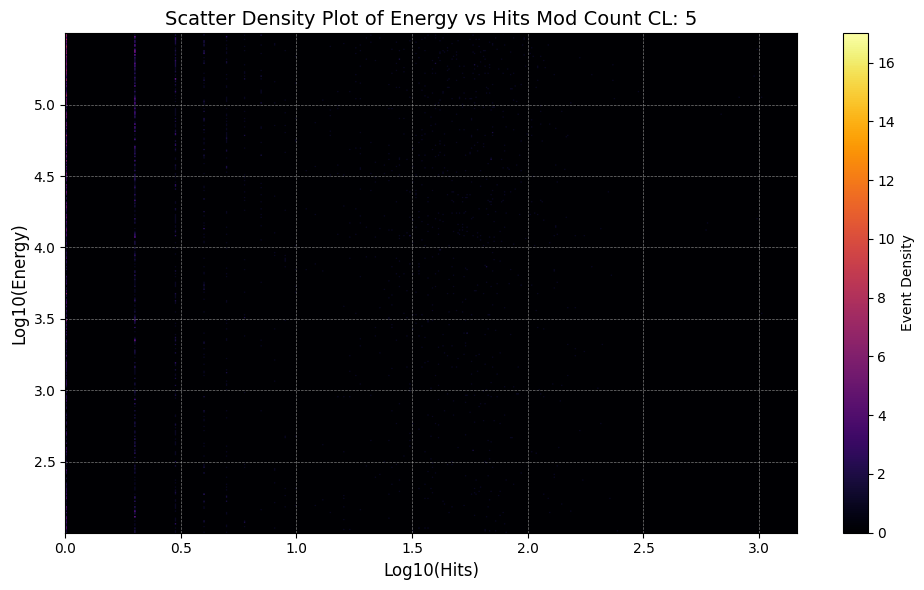

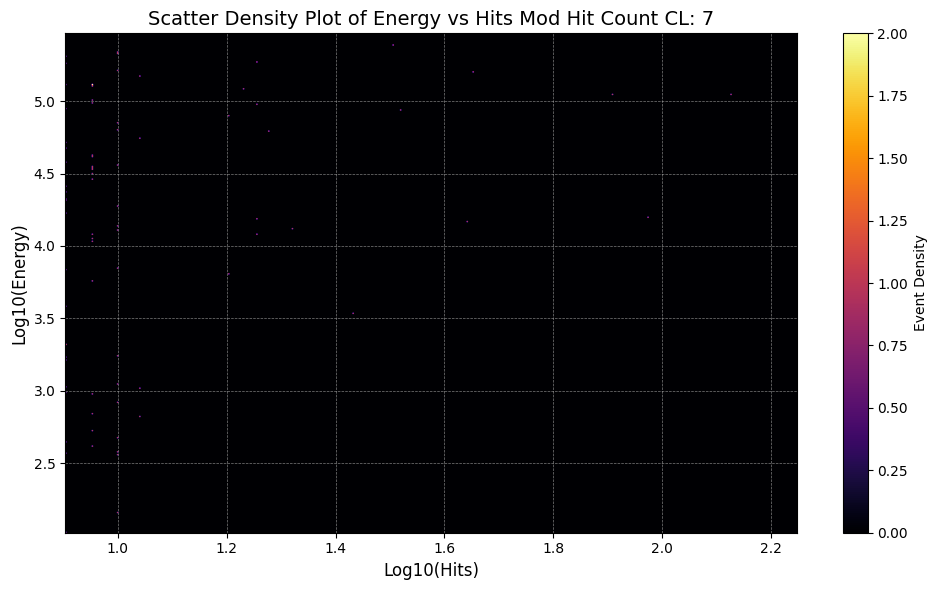

/viper/u1/arego/Project/Thesis/plot/TD/Merged_20.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


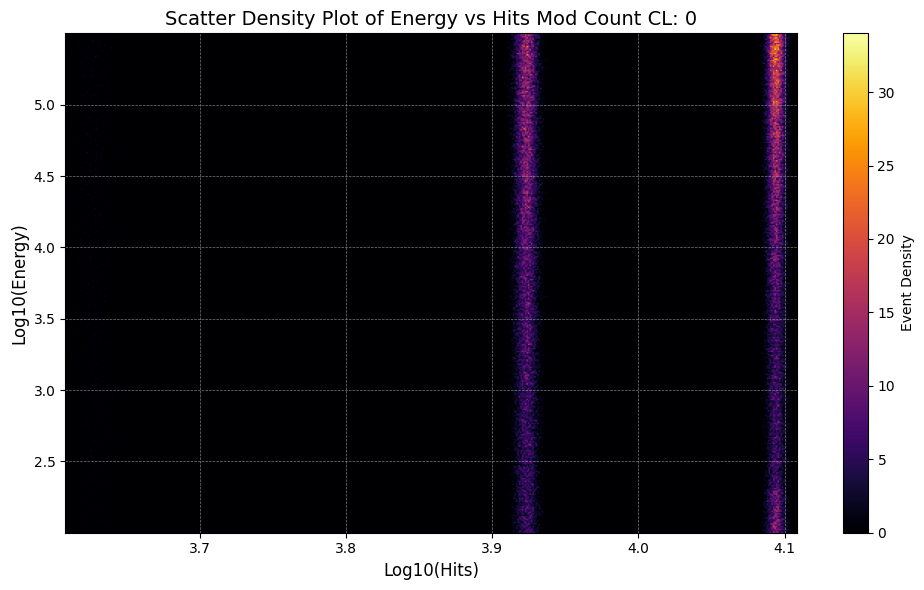

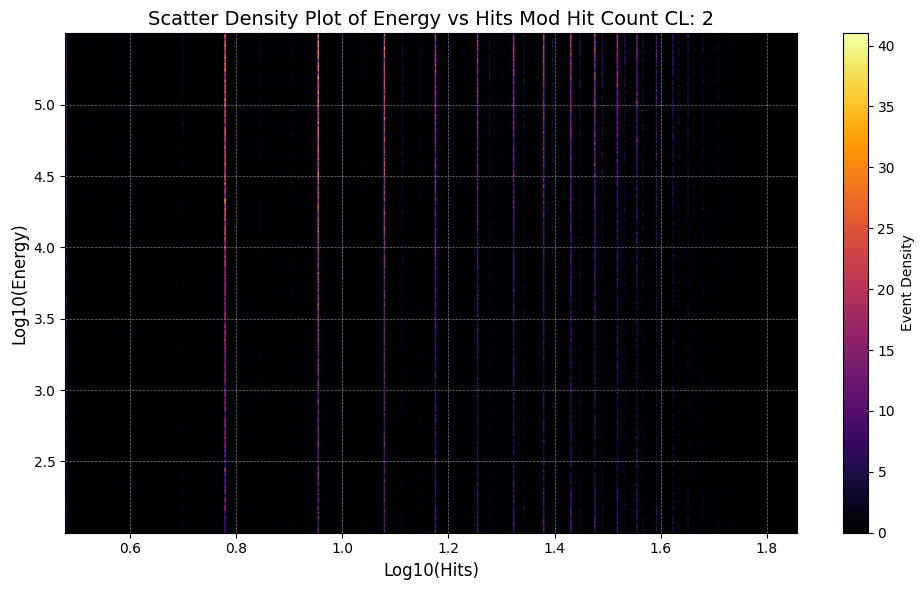

/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/scatter_density_axes.py:48: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim(np.min(x), np.max(x))
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/scatter_density_axes.py:49: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  self.set_ylim(np.min(y), np.max(y))


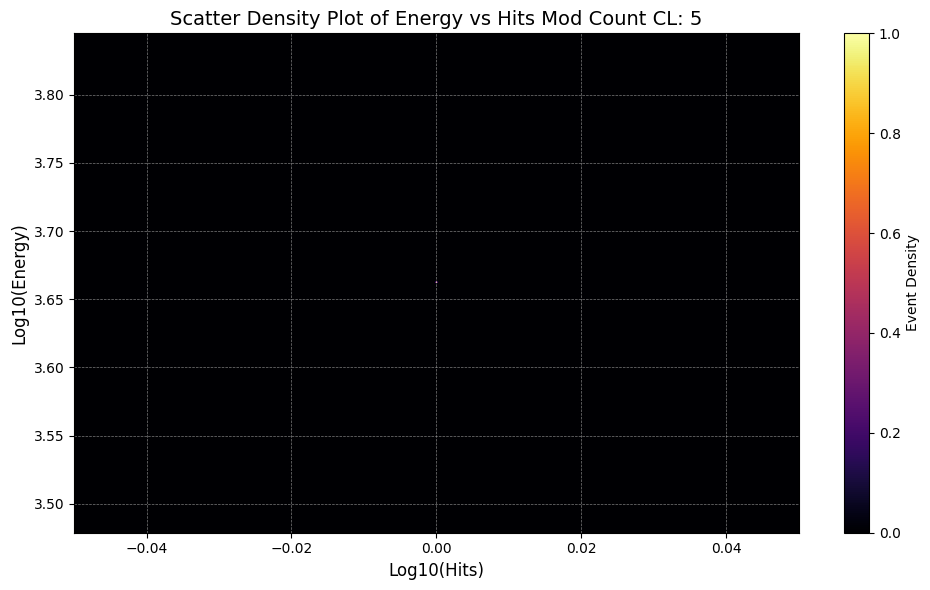

In [65]:
for file in files:
    df=pd.read_parquet(file)
    cols=[c for c in df.columns if 'Mod' in c]
    print(file)
    for col in cols[::5]:
        plot_energy_hits(df[col],df['energy'],col)

Gif Generation Code

In [66]:
import os
import numpy as np
import matplotlib.pyplot as plt
import mpl_scatter_density
import pandas as pd
import imageio

# Define colormap
cmap = plt.cm.inferno  

def sanitize_filename(name):
    """Replace problematic characters in filenames."""
    return name.replace(" ", "_").replace("_", "_")

def plot_energy_hits(hit, energy, col, filename):
    """Generates and saves a scatter density plot."""
    
    valid_indices = (energy > 0) & (hit > 0)
    hit = hit[valid_indices]
    energy = energy[valid_indices]

    if hit.shape[0] == 0 or energy.shape[0] == 0:
        return None  # Skip empty plots

    x = np.log10(hit)
    y = np.log10(energy)

    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, cmap=cmap)
    fig.colorbar(density, label='Event Density')

    ax.set_xlabel("Log10(Hits)", fontsize=12)
    ax.set_ylabel("Log10(Energy)", fontsize=12)
    ax.set_title(f"Scatter Density Plot of {col}", fontsize=14)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    plt.tight_layout()
    plt.savefig(filename)  # Save the frame
    plt.close(fig)  # Free memory

# Directory to store images & GIFs
output_dir = "/raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy"
os.makedirs(output_dir, exist_ok=True)

for file in files:
    df = pd.read_parquet(file)
    cols=[c for c in df.columns if 'Mod' in c]
    print(f"Processing: {file}")

    image_files = []  # Reset for each file

    for col in cols:
        safe_col = sanitize_filename(col)
        img_path = os.path.join(output_dir, f"{os.path.basename(file)}_{safe_col}.png")
        
        plot_energy_hits(df[col], df["energy"], col, img_path)
        
        if os.path.exists(img_path):  # Ensure file was created
            image_files.append(img_path)

    # ✅ Create a GIF for this file (only if images exist)
    if image_files:
        gif_path = os.path.join(output_dir, f"{os.path.basename(file)}.gif")
        imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)
        print(f"GIF saved: {gif_path}")
    else:
        print(f"No images generated for {file}, skipping GIF.")


Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/scatter_density_axes.py:48: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim(np.min(x), np.max(x))
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_21.parquet.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2.parquet.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2_20_21.parquet.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2_21.parquet.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2_20.parquet.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_20_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_20_21.parquet.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_20.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/scatter_density_axes.py:48: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim(np.min(x), np.max(x))
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/scatter_density_axes.py:49: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  self.set_ylim(np.min(y), np.max(y))
/tmp/ipykernel_18497/1768372189.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that 

GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_20.parquet.gif


In [60]:
for file in files:
    df=pd.read_parquet(file)
    break

In [67]:
import os
import numpy as np
import matplotlib.pyplot as plt
import mpl_scatter_density
import pandas as pd
import imageio

# Define colormap
cmap = plt.cm.inferno  

def sanitize_filename(name):
    """Replace problematic characters in filenames."""
    return name.replace(" ", "_").replace("_", "_")

def plot_energy_hits(hit, energy, col, filename):
    """Generates and saves a scatter density plot."""
    
    valid_indices = (energy > 0) & (hit > 0)
    hit = hit[valid_indices]
    energy = energy[valid_indices]

    if hit.shape[0] == 0 or energy.shape[0] == 0:
        return None  # Skip empty plots

    x = np.log10(hit)
    y = np.log10(energy)

    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, cmap=cmap)
    fig.colorbar(density, label='Event Density')

    ax.set_xlabel("Log10(Hits)", fontsize=12)
    ax.set_ylabel("Log10(Energy)", fontsize=12)
    ax.set_title(f"Scatter Density Plot of {col}", fontsize=14)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    plt.tight_layout()
    plt.savefig(filename)  # Save the frame
    plt.close(fig)  # Free memory

# Directory to store images & GIFs
output_dir = "/raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy"
os.makedirs(output_dir, exist_ok=True)

for file in files:
    df = pd.read_parquet(file)
    
    # Extract columns containing 'Mod'
    cols = [c for c in df.columns if 'Mod' in c]
    print(f"Processing: {file}")

    image_files = []  # Reset for each file

    for col in cols:
        safe_col = sanitize_filename(col)
        img_path = os.path.join(output_dir, f"{os.path.basename(file).replace('.parquet', '')}_{safe_col}.png")
        
        plot_energy_hits(df[col], df["energy"], col, img_path)
        
        if os.path.exists(img_path):  # Ensure file was created
            image_files.append(img_path)

    # Create a GIF for this file (only if images exist)
    if image_files:
        gif_path = os.path.join(output_dir, f"{os.path.basename(file).replace('.parquet', '')}.gif")
        imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)
        print(f"GIF saved: {gif_path}")
    else:
        print(f"No images generated for {file}, skipping GIF.")


Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/scatter_density_axes.py:48: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim(np.min(x), np.max(x))
/tmp/ipykernel_18497/1684074075.py:67: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_21.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1684074075.py:67: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_20_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1684074075.py:67: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


GIF saved: /raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2_20_21.gif
Processing: /viper/u1/arego/Project/Thesis/plot/TD/Merged_2_21.parquet


/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/raven/u/arego/olympus/lib/python3.10/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)
/tmp/ipykernel_18497/1684074075.py:67: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_path, [imageio.imread(img) for img in image_files], duration=1)


FileNotFoundError: No such file: '/raven/u/arego/project/Stuff_For_Thesis/TrackR_Mod_V_Energy/Merged_2_21_Mod_Count_CL:_0.png'